<center><img src="https://github.com/hse-ds/iad-applied-ds/blob/master/2021/hw/hw1/img/logo_hse.png?raw=1" width="1000"></center>

<h1><center>Прикладные задачи анализа данных</center></h1>
<h2><center>Домашнее задание 4: Прогнозирование временных рядов</center></h2>

# Введение

В этом задании Вам предстоит разобраться с основами анализа и прогнозирования временных рядов. 


![image](https://imgs.xkcd.com/comics/extrapolating.png)

In [1]:
!pip install orbit-ml
!pip install prophet
!pip install sktime[all_extras]

  Using cached https://files.pythonhosted.org/packages/08/b9/b4f0938b38dbe775c4def707f525ab816b9d0215ecd8ab2d76780f4514f8/cmdstanpy-0.9.68-py3-none-any.whl
ERROR: fbprophet 0.7.1 has requirement cmdstanpy==0.9.5, but you'll have cmdstanpy 0.9.68 which is incompatible.
  Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5
  Using cached https://files.pythonhosted.org/packages/e3/e2/204c9c6beaf9e05ad28bd589c154afff35dffa6166d76841d3c0dec6c1e3/cmdstanpy-0.9.5-py3-none-any.whl
ERROR: prophet 1.0.1 has requirement cmdstanpy==0.9.68, but you'll have cmdstanpy 0.9.5 which is incompatible.
  Found existing installation: cmdstanpy 0.9.68
    Uninstalling cmdstanpy-0.9.68:
      Successfully uninstalled cmdstanpy-0.9.68


In [2]:
%matplotlib inline

from IPython import display
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np


## Задание 1 (2 балла). Поиск и предобработка данных.

В этом задании Вам необходимо _самостоятельно_ найти два временных ряда: один должен обладать месячной частотой, а второй — дневной.

Мы советуем поискать соответствующие временные ряды на платформе [kaggle](https://www.kaggle.com/datasets) или же взять один из [популярных](https://medium.com/analytics-vidhya/10-time-series-datasets-for-practice-d14fec9f21bc) временных рядов для анализа. 

**Не рекоммендуется** использовать в качестве временных рядов цены финансовых инструментов в силу плохой предсказуемости изменения цен. **Запрещается** использовать готовые наборы данных из библиотек для анализа временных рядов, например, `from orbit.utils.dataset import load_iclaims`.

![bitcoin](https://avatars.mds.yandex.net/get-zen_doc/3417386/pub_6017dd4b8d30cb1780864ae0_6017f4aa8d30cb1780bf66ce/scale_1200)




В качестве отчета по заданию:

* Опишите источники временных рядов (ссылки на страницы скачивания). В случае, если данные требовали дополнительной обработки, приведите код этой обработки, загрузите данные в личное облачное хранилище и приведите ссылку на скачивание. Процесс получения временных рядов должен быть **четко** расписан и полностью **воспроизводиться**. 

* Приведите код считывания временных рядов из файлов и разделения на train/test. Соотношение размеров train/test на Ваше усмотрение, но мы советуем Вам выбрать 80% на 20%, если в test остаётся хотя бы пара лет наблюдений.



Данные по месяцам -- средняя температура и уровень осадков в Бангладеше  https://www.kaggle.com/yakinrubaiat/bangladesh-weather-dataset

Данные по дням -- взаимодействия пользователей с сайтом

https://www.kaggle.com/bobnau/daily-website-visitors?select=daily-website-visitors.csv



In [3]:
! rm Temp_and_rain.csv
! rm daily-website-visitors.csv
! rm website_visitors.zip
! rm Bangladesh_weather.zip

In [4]:
# скачаем данные
!wget https://www.dropbox.com/s/bau4it8vwlstsip/Bangladesh_weather.zip
!unzip -q Bangladesh_weather.zip

--2021-06-14 17:41:54--  https://www.dropbox.com/s/bau4it8vwlstsip/Bangladesh_weather.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.82.18, 2620:100:6030:18::a27d:5012
Connecting to www.dropbox.com (www.dropbox.com)|162.125.82.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/bau4it8vwlstsip/Bangladesh_weather.zip [following]
--2021-06-14 17:41:55--  https://www.dropbox.com/s/raw/bau4it8vwlstsip/Bangladesh_weather.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8bc21dce6ae0d547136925b7eb.dl.dropboxusercontent.com/cd/0/inline/BQYyGtSEYjLiMBt9Cc0PNzdT55VFVF0NsfCpgfh-_06bObqUoYwhFRYSOBiwWeZF7BFHAwqn5iAYd7XFp5uYRIkyGHcPeOCdnVrvAqK6OfeGDjealQMV3GyfXMLeXoWzRVC8ruD0z71meOMn469i2qwz/file# [following]
--2021-06-14 17:41:55--  https://uc8bc21dce6ae0d547136925b7eb.dl.dropboxusercontent.com/cd/0/inline/BQYyGtSEYjLiMBt9Cc0PNzdT55VFVF0NsfCpgfh-_06bObqUoYwhFRYSO

In [5]:
!wget https://www.dropbox.com/s/6yjcicvaixxrj1f/website_visitors.zip
!unzip -q website_visitors.zip

--2021-06-14 17:41:56--  https://www.dropbox.com/s/6yjcicvaixxrj1f/website_visitors.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.82.18, 2620:100:6032:18::a27d:5212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.82.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/6yjcicvaixxrj1f/website_visitors.zip [following]
--2021-06-14 17:41:56--  https://www.dropbox.com/s/raw/6yjcicvaixxrj1f/website_visitors.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc4844817ca513bec279d1a1ee4.dl.dropboxusercontent.com/cd/0/inline/BQa7RMluzimq36u347RphXMnUEB32nQKA9pqMaPMO7cfyUh7V5ud27AMZJ_xpHPok5ReXstP-nN-5nIx_fdaFvvMhH2obMMV67NPstEbBUV8mknyu1kX2IOv6gBrQrg41k-beMa8OCS6XcwF6lKAalnI/file# [following]
--2021-06-14 17:41:57--  https://ucc4844817ca513bec279d1a1ee4.dl.dropboxusercontent.com/cd/0/inline/BQa7RMluzimq36u347RphXMnUEB32nQKA9pqMaPMO7cfyUh7V5ud27AMZJ_xpHP

In [6]:
# считаем файлы
ts1 = pd.read_csv('/content/Temp_and_rain.csv')
ts2 = pd.read_csv("/content/daily-website-visitors.csv")

In [7]:
ts1 = ts1.replace({1:'01', 2:'02', 3:'03', 4:'04', 5:'05', 6:'06', 7:'07',
             8:'08', 9:'09'})

In [8]:
ts1

,tem,Month,Year,rain
0,16.9760,01,1901,18.53560
1,19.9026,02,1901,16.25480
2,24.3158,03,1901,70.79810
3,28.1834,04,1901,66.16160
4,27.8892,05,1901,267.21500
...,...,...,...,...
1375,28.0642,08,2015,512.12700
1376,28.1230,09,2015,353.86900
1377,26.8624,10,2015,81.59940
1378,23.1842,11,2015,4.60815


In [9]:
ts1['Year-month'] = ts1['Year'].astype(str) + '-' + ts1['Month'].astype(str)

In [10]:
def delete_commas(text):
    text_new = text[:text.find(',')] + '' + text[text.find(','):].replace(',', '')
    
    return text_new

In [11]:
ts2['Page.Loads'] = ts2['Page.Loads'].apply(delete_commas)
ts2['Unique.Visits'] = ts2['Unique.Visits'].apply(delete_commas)
ts2['First.Time.Visits'] = ts2['First.Time.Visits'].apply(delete_commas)
ts2['Returning.Visits'] = ts2['Returning.Visits'].apply(delete_commas)

In [12]:
ts2['Page.Loads'] = pd.to_numeric(ts2['Page.Loads'])
ts2['Unique.Visits'] = pd.to_numeric(ts2['Unique.Visits'])
ts2['First.Time.Visits'] = pd.to_numeric(ts2['First.Time.Visits'])
ts2['Returning.Visits'] = pd.to_numeric(ts2['Returning.Visits'])
ts2['First.Time.Visits'] = pd.to_numeric(ts2['First.Time.Visits'])

In [13]:
# сделаем разбиение на train/test

test_size_ts1 = 20*12 # предсказания осадков и температуры для последних 20 лет

train_ts1 = ts1[:-test_size_ts1]
test_ts1  = ts1[-test_size_ts1:]

In [14]:
test_size_ts2 = 365 # посетители сайта за последний год

train_ts2 = ts2[:-test_size_ts2]
test_ts2 = ts2[-test_size_ts2:]

## Задание 2. Анализ временных рядов (1 балла).

* Отрисуйте временные ряды и визуально сделайте различимым разбиение на выборки — либо вертикальной чертой, либо разными цветами.

* Постройте графики автокорреляционных функций для выбранных временных рядов. Прокомментируйте их: являются ли временные ряды сезонными? Видна ли на графиках длина сезонной составляющей ряда?

* В случае присутствия сезонности, разбейте временной ряд на повторяющиеся фрагменты и нарисуйте их наложенными для иллюстрации этой сезонности.

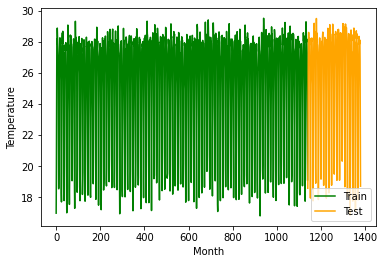

In [15]:
# отрисуем временные ряды
plt.plot(train_ts1['tem'], 'green', test_ts1['tem'], 'orange')
plt.rcParams["figure.figsize"] = (80,20)
plt.xlabel('Month')
plt.ylabel('Temperature')
plt.legend(["Train","Test"])
plt.show() 

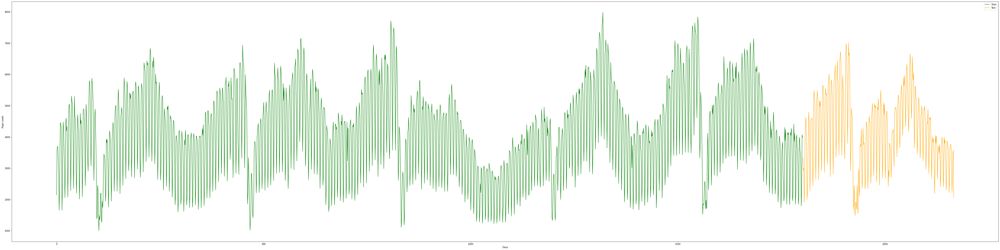

In [16]:
plt.plot(train_ts2['Page.Loads'], 'green', test_ts2['Page.Loads'], 'orange')
plt.xlabel('Days')
plt.rcParams["figure.figsize"] = (80,20)
plt.ylabel('Page.Loads')
plt.legend(["Train","Test"])
plt.show() 

In [17]:
# посчитайте и нарисуйте график автокорреляционной функции
# hint, используйте для этого np.correlate(..., mode='full')

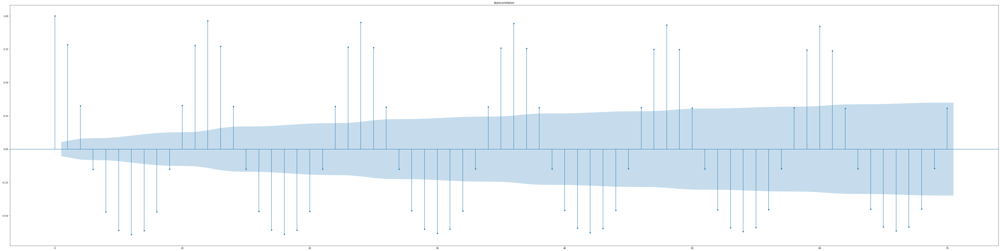

In [18]:
# https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/

from statsmodels.graphics.tsaplots import plot_acf

plot_acf(ts1['tem'], lags=70)
plt.show()

На графике температуры хорошо видна сезонность: это где-то 12 месяцев (между двумя локальными максимумами)

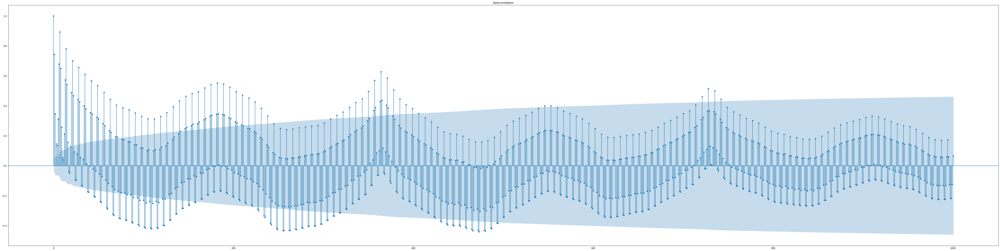

In [19]:
plot_acf(ts2['Page.Loads'], lags=1000)
plt.show()

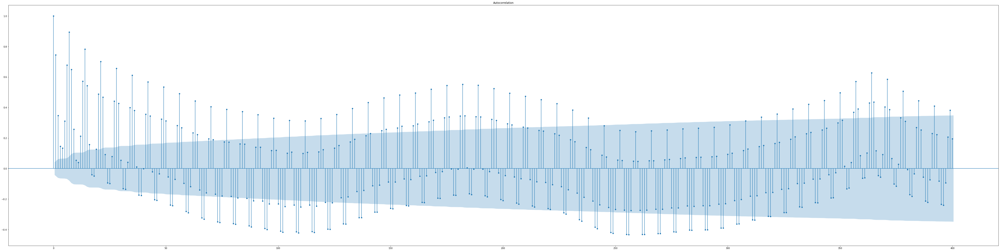

In [20]:
plot_acf(ts2['Page.Loads'], lags=400)
plt.show()

Сезонность - непонятная (пик в конце года, но есть также локальный максимум в середине года)

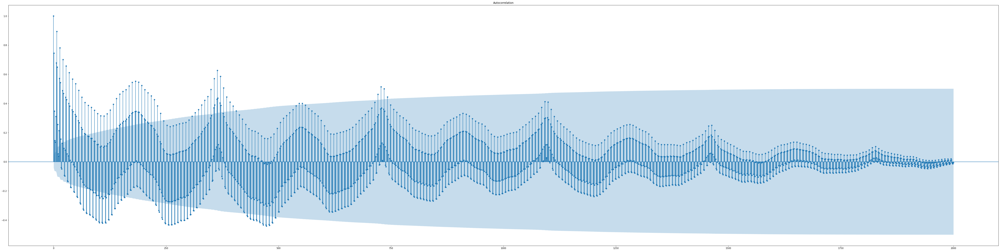

In [21]:
#https://dganais.medium.com/autocorrelation-in-time-series-c870e87e8a65
import statsmodels.api as sm
sm.graphics.tsa.plot_acf(ts2['Page.Loads'], lags=2000)
plt.show()

In [22]:
# разбейте временной ряд на повторяющиеся участки по длине сезонной составляющей и нарисуйте их наложенными

<AxesSubplot:xlabel='Month'>

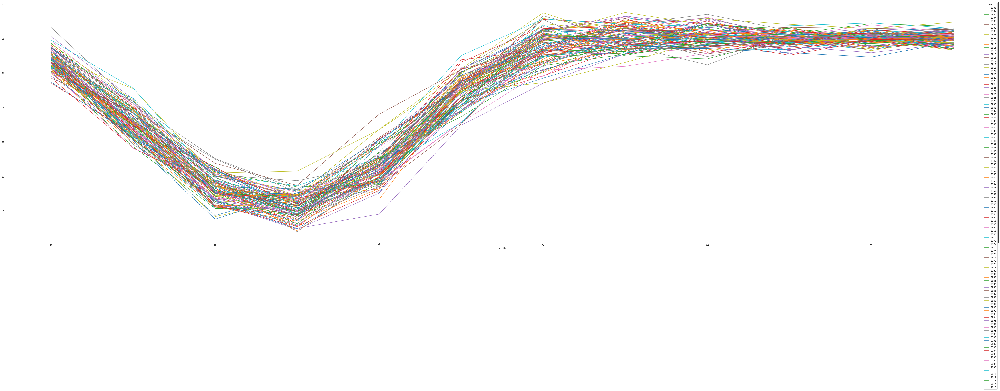

In [23]:
unstacked = ts1.set_index(['Year', 'Month']).tem.unstack(-2) # разбиваем по 12 месяцев, т.е. по году
unstacked.plot()

# https://stackoverflow.com/questions/60140744/split-up-time-series-per-year-for-plotting

https://pogoda.365c.ru/bangladesh

Факт-чек - самая высокая тмепература в Бангладеше действительно в марте-апреле.

In [24]:
ts2['Date'][0].split('/')

['9', '14', '2014']

In [25]:
ts2['date'] = ''
ts2['day_num'] = ''
ts2['month'] = ''
ts2['year'] = ''
for i in range(len(ts2)):
  splitted = ts2['Date'][i].split('/')
  period = pd.Period(ts2['Date'][i], freq = 'D')
  ts2['day_num'][i] = period.dayofyear
  ts2['month'][i] = splitted[0]
  ts2['date'][i] = splitted[1]
  ts2['year'][i] = splitted[2]

ts2['year'] = pd.to_numeric(ts2['year'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dis

In [26]:
# https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Period.html

In [27]:
ts2

,Row,Day,Day.Of.Week,Date,Page.Loads,Unique.Visits,First.Time.Visits,Returning.Visits,date,day_num,month,year
0,1,Sunday,1,9/14/2014,2146,1582,1430,152,14,257,9,2014
1,2,Monday,2,9/15/2014,3621,2528,2297,231,15,258,9,2014
2,3,Tuesday,3,9/16/2014,3698,2630,2352,278,16,259,9,2014
3,4,Wednesday,4,9/17/2014,3667,2614,2327,287,17,260,9,2014
4,5,Thursday,5,9/18/2014,3316,2366,2130,236,18,261,9,2014
...,...,...,...,...,...,...,...,...,...,...,...,...
2162,2163,Saturday,7,8/15/2020,2221,1696,1373,323,15,228,8,2020
2163,2164,Sunday,1,8/16/2020,2724,2037,1686,351,16,229,8,2020
2164,2165,Monday,2,8/17/2020,3456,2638,2181,457,17,230,8,2020
2165,2166,Tuesday,3,8/18/2020,3581,2683,2184,499,18,231,8,2020


In [28]:
ts2 = ts2.replace({'1':'01', '2':'02', '3':'03', '4':'04', '5':'05', '6':'06', '7':'07',
             '8':'08', '9':'09'})

In [29]:
ts2['Date_new'] = ts2['year'].astype(str) + '-' + ts2['month'].astype(str)+ '-' + ts2['date'].astype(str)

In [30]:
# 2014-09-14

Text(0, 0.5, 'Page loads')

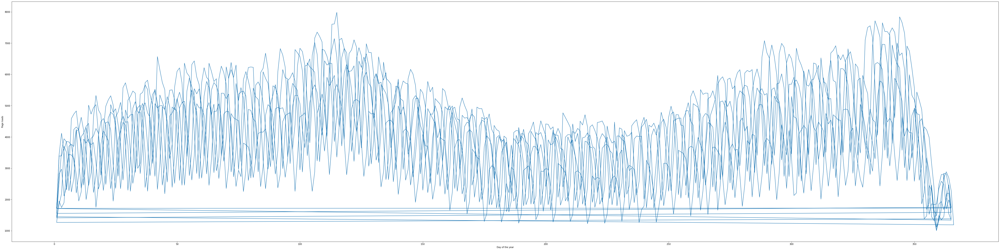

In [31]:
plt.plot(ts2['day_num'], ts2['Page.Loads'])
plt.xlabel('Day of the year')
plt.ylabel('Page loads')

Видим два пика, то есть сезонность в течение года наблюдается

## Задание 3. Предсказание месячного временного ряда (4.5 балла).

В этом задании Вам предстоит попробовать предсказать месячный временной несколькими готовыми моделями со скользящим или растущим окном и выбрать среди них наилучшую.

В качестве метрики сравнения используйте MAE между истинными и предсказанными значениями ряда на тестовом отрезке.


### NaiveForecaster из sktime (0.5 балл).

Посчитайте предсказания следующими двумя наивными способами:

* $\hat{y}_{t+1} = y_{t}$
* $\hat{y}_{t+1} = y_{t-seasonality+1}$

In [32]:
# ваш код обучения моделей здесь
from sktime.forecasting.naive import NaiveForecaster

naive = NaiveForecaster(strategy = 'last')
naive.fit(train_ts1['tem'])

NaiveForecaster()

In [33]:
from sktime.forecasting.base import ForecastingHorizon
fh = ForecastingHorizon(test_ts1.index, is_relative=False)

In [34]:
pred_ts11 = naive.predict(fh)

In [35]:
# посчитайте метрики на test
from sklearn.metrics import mean_absolute_error as MAE

MAE(test_ts1['tem'], pred_ts11)

6.4451583333333335

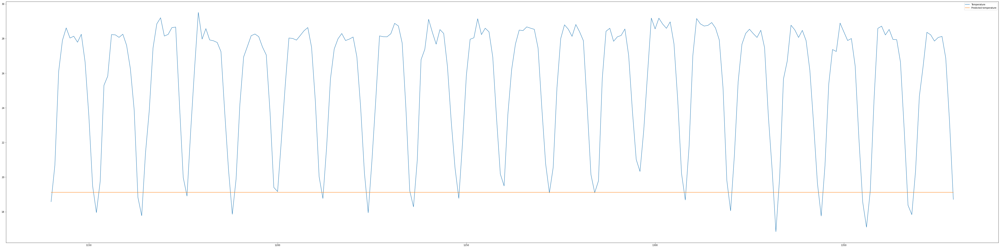

In [36]:
plt.plot(test_ts1['tem'])
plt.plot(pred_ts11)
plt.legend(['Temperature', 'Predicted temperature'])

Действительно наивно.

### ARIMA/AutoArima (1 балл).

Обучите из библиотеки `sktime` модели:

* SARIMA(1, 1, 1)(1, 0, 0)[12] (`ARIMA` в `sktime`)
* Алгоритм Хиндмана-Хандакара подбора SARIMA (`AutoARIMA` в `sktime`)

In [37]:
from sktime.forecasting.arima import ARIMA, AutoARIMA

# ваш код обучения моделей здесь

model_arima = ARIMA(order = (1, 1, 1), seasonal_order = (1, 0, 0, 12))
model_fit = model_arima.fit(train_ts1['tem'])

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


In [38]:
pred_ts12 = model_arima.predict(fh)

AutoARIMA

In [39]:
model_autoarima = ARIMA(sp = 12, stationary = True) # т.к. ряд стационарный, и 12 месяцев в одном сезоне
model_fit = model_autoarima.fit(train_ts1['tem'])

In [40]:
pred_ts13 = model_autoarima.predict(fh)

In [41]:
# посчитайте метрики на test
MAE(test_ts1['tem'], pred_ts12)

0.9129464642754044

In [42]:
MAE(test_ts1['tem'], pred_ts13)

3.3042129627957584

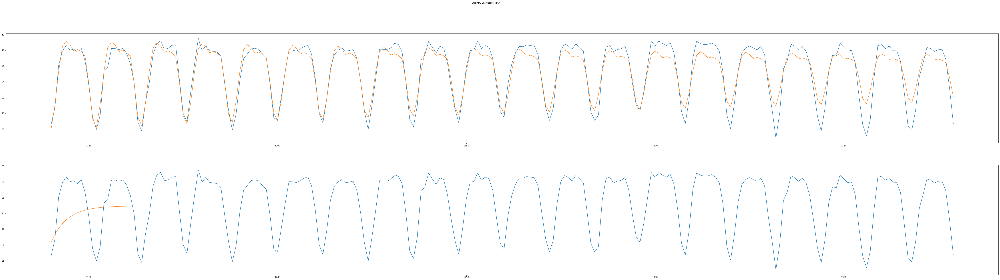

In [43]:
fig, (ax1, ax2) = plt.subplots(2)
fig.suptitle('ARIMA vs AutoARIMA')

ax1.plot(test_ts1['tem'])
ax1.plot(pred_ts12)

ax2.plot(test_ts1['tem'])
ax2.plot(pred_ts13)

SARIMA предсказывает сильно лучше

### LGT/DLT (1 балл).

Обучите из библиотеки `orbit` модели LGT и DLT

In [44]:
ts1

,tem,Month,Year,rain,Year-month
0,16.9760,01,1901,18.53560,1901-01
1,19.9026,02,1901,16.25480,1901-02
2,24.3158,03,1901,70.79810,1901-03
3,28.1834,04,1901,66.16160,1901-04
4,27.8892,05,1901,267.21500,1901-05
...,...,...,...,...,...
1375,28.0642,08,2015,512.12700,2015-08
1376,28.1230,09,2015,353.86900,2015-09
1377,26.8624,10,2015,81.59940,2015-10
1378,23.1842,11,2015,4.60815,2015-11


In [45]:
from orbit.models.lgt import LGTFull
from orbit.models.dlt import DLTFull

# ваш код обучения моделей здесь

LGT = LGTFull(
    response_col = 'tem', 
    date_col = 'Year-month',
    seasonality = 12,
    #seed=8888
)

LGT.fit(train_ts1)

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


In [46]:
pred_ts14 = LGT.predict(test_ts1)

In [47]:
DLT = DLTFull(
    response_col = 'tem', 
    date_col = 'Year-month',
    seasonality = 12,
    #seed=8888
)

DLT.fit(train_ts1)

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


In [48]:
pred_ts15 = DLT.predict(test_ts1)

In [49]:
# посчитайте метрики на test
MAE(test_ts1['tem'], pred_ts14['prediction'])

0.6223843455566189

In [50]:
MAE(test_ts1['tem'], pred_ts15['prediction'])

0.6873024423990631

Мы видим, что у модели LGT наименьшая абсолютная ошибка (0.62), то есть она лучше всего предсказывает температуру на тестовом периоде

### ETS (2 балла).

Обучите из библиотеки `sklearn` модели:

* ETS(AAA) (`ExponentialSmoothing` в `sktime`)
* ETS с автоматическим выбором по AIC (`AutoETS` в `sktime`)

In [51]:
from sktime.forecasting.exp_smoothing import ExponentialSmoothing
from sktime.forecasting.ets import AutoETS

# ваш код обучения моделей здесь

ETS = ExponentialSmoothing(trend = 'add', seasonal = 'multiplicative', sp = 12)
ETS.fit(train_ts1['tem'])

ExponentialSmoothing(seasonal='multiplicative', sp=12, trend='add')

In [52]:
pred_ts16 = ETS.predict(fh)

In [53]:
MAE(test_ts1['tem'], pred_ts16)

0.583813824256422

In [54]:
AutoETS = AutoETS(auto = True, sp = 12)
AutoETS.fit(train_ts1['tem'])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/exponential_smoothing/ets.py:1135: RuntimeWarning: invalid value encountered in log
  logL -= np.sum(np.log(yhat))


AutoETS(auto=True, sp=12)

In [55]:
pred_ts17 = AutoETS.predict(fh)
test_ts1['pred'] = pred_ts17

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [56]:
MAE(test_ts1['tem'], pred_ts17)

0.5487710305138105

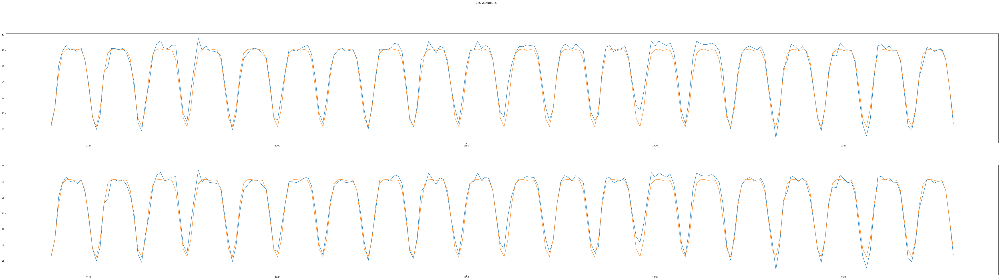

In [57]:
fig, (ax1, ax2) = plt.subplots(2)
fig.suptitle('ETS vs AutoETS')

ax1.plot(test_ts1['tem'])
ax1.plot(pred_ts16)

ax2.plot(test_ts1['tem'])
ax2.plot(pred_ts17)

MAE ниже у AutoETS, т.к. по всей видимости он автоматически сравнивает параметры по AIC. Это наилучший результат из всех

In [58]:
# посчитайте метрики на test

Нарисуйте для наилучшей модели предсказания с доверительным интервалом (если модель выдает его) и наложите их на истинные значения. В `sktime` `ETS` модель пока ещё не выдаёт доверительные интервалы, но при желании до них можно дотянуться :)

In [59]:
from sktime.utils.plotting import plot_series

In [60]:
test_ts1

,tem,Month,Year,rain,Year-month,pred
1140,18.5789,01,1996,7.05748,1996-01,18.480333
1141,20.6901,02,1996,22.91020,1996-02,20.664158
1142,26.0952,03,1996,52.88440,1996-03,25.120306
1143,27.8947,04,1996,166.54100,1996-04,27.771409
1144,28.6148,05,1996,232.49700,1996-05,28.264997
...,...,...,...,...,...,...
1375,28.0642,08,2015,512.12700,2015-08,28.226104
1376,28.1230,09,2015,353.86900,2015-09,28.190971
1377,26.8624,10,2015,81.59940,2015-10,26.895985
1378,23.1842,11,2015,4.60815,2015-11,23.207541


(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='tem'>)

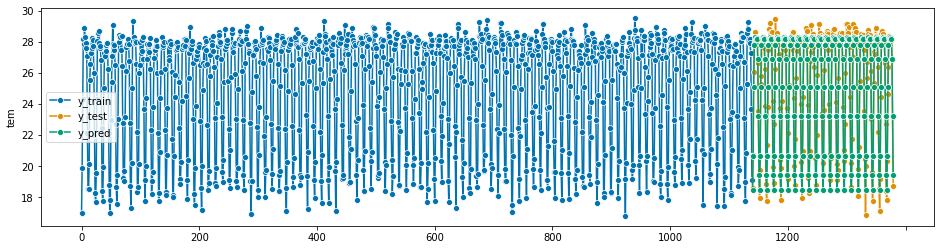

In [61]:
plot_series(train_ts1['tem'], test_ts1['tem'], test_ts1['pred'], labels=['y_train', "y_test", "y_pred"])

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='tem'>)

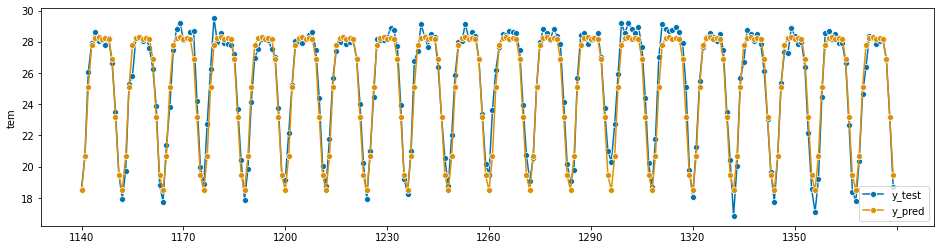

In [62]:
# нарисуйте пресказания

plot_series(test_ts1['tem'], test_ts1['pred'], labels=[ "y_test", "y_pred"])

# из-за того, что много данных, на полном графике не совсем видны предсказания, поэтому выведем тоько тест и предсказания

Как выидно на графике, предсказания хорошо совпадают с истинными значениями

In [63]:
#!pip install matplotlib==3.1.3

## Задание 4. Предсказание дневного временного ряда (2.5 балла).

В этом задании Вам предстоит попробовать предсказать выбранный Вами дневной временной ряд.

Аналогично, в качестве метрики используем MAE.



In [64]:
ts2 = ts2[['Page.Loads', 'Date_new']]

In [65]:
test_size_ts2 = 365 # посетители сайта за последний год

train_ts2 = ts2[:-test_size_ts2]
test_ts2 = ts2[-test_size_ts2:]

### NaiveForecaster из sktime (0.5 балла).

Посчитайте предсказания следующими двумя наивными способами:

* $\hat{y}_{t+1} = y_{t}$
* $\hat{y}_{t+1} = y_{t-seasonality+1}$

In [66]:
from sktime.forecasting.naive import NaiveForecaster
naive = NaiveForecaster(strategy = 'last') # последний год

In [67]:
# ваш код обучения моделей здесь

naive.fit(train_ts2['Page.Loads'])

NaiveForecaster()

In [68]:
from sktime.forecasting.base import ForecastingHorizon

In [69]:
fh = ForecastingHorizon(test_ts2.index, is_relative=False) # последний год

In [70]:
fh

ForecastingHorizon([1802, 1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811,
            ...
            2157, 2158, 2159, 2160, 2161, 2162, 2163, 2164, 2165, 2166],
           dtype='int64', length=365, is_relative=False)

In [71]:
pred_ts21 = naive.predict(fh)

In [72]:
# посчитайте метрики на test
from sklearn.metrics import mean_absolute_error as MAE

In [73]:
MAE(test_ts2['Page.Loads'], pred_ts21)

979.6

:)

Учтем сезонность

In [74]:
naive = NaiveForecaster(strategy = 'last', sp = 180) # сезонность полгода
naive.fit(train_ts2['Page.Loads'])

NaiveForecaster(sp=180)

In [75]:
pred_ts22 = naive.predict(fh)

In [76]:
MAE(test_ts2['Page.Loads'], pred_ts22)

1500.704109589041

### KTR из orbit (1 балл).



In [77]:
test_ts2

,Page.Loads,Date_new
1802,3355,2019-08-21
1803,2925,2019-08-22
1804,3010,2019-08-23
1805,1896,2019-08-24
1806,2501,2019-08-25
...,...,...
2162,2221,2020-08-15
2163,2724,2020-08-16
2164,3456,2020-08-17
2165,3581,2020-08-18


In [78]:
from orbit.models.ktrlite import KTRLiteMAP

# ваш код обучения моделей здесь

KTR = KTRLiteMAP(
    response_col = 'Page.Loads', 
    date_col = 'Date_new',
    seasonality = 240
)

In [79]:
KTR.fit(train_ts2)

In [80]:
pred_ts23 = KTR.predict(test_ts2)

In [81]:
pred_ts23.head()

,Date_new,prediction_5,prediction,prediction_95
0,2019-08-21,1726.502587,4017.390653,6326.723156
1,2019-08-22,1770.968204,4017.393992,6273.047200
2,2019-08-23,1709.065332,4017.398259,6296.430075
3,2019-08-24,1710.181502,4017.403440,6296.939742
4,2019-08-25,1729.971119,4017.409523,6317.662787


In [82]:
# посчитайте метрики на test
MAE(test_ts2['Page.Loads'], pred_ts23['prediction'])

976.8905701801983

In [85]:
pred_ts23[['prediction']]

,prediction
0,4017.390653
1,4017.393992
2,4017.398259
3,4017.403440
4,4017.409523
...,...
360,4017.390618
361,4017.393876
362,4017.398061
363,4017.403161


In [88]:
from orbit.diagnostics.plot import plot_predicted_data

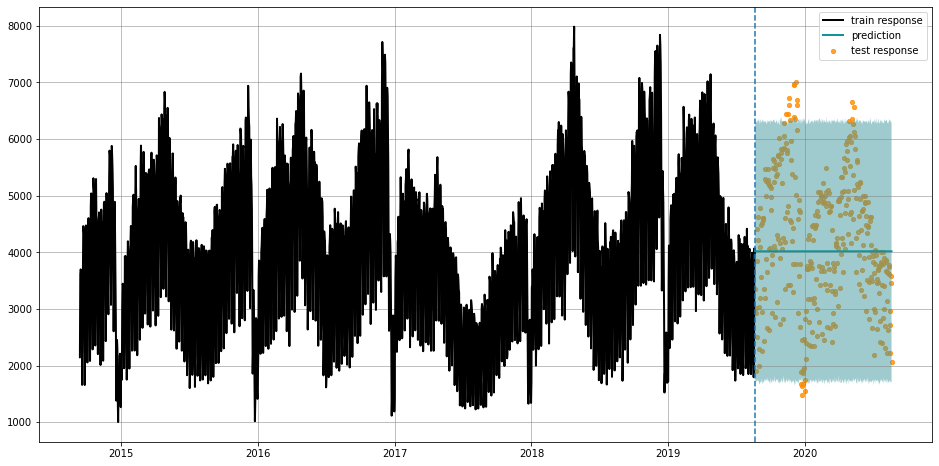

In [89]:
plot_predicted_data(training_actual_df=train_ts2, predicted_df=pred_ts23,
                        date_col=KTR.date_col, actual_col=KTR.response_col,
                        test_actual_df=test_ts2, insample_line=True);

Модель не предсказала сезонность. Скорее всего, это связано с тем, что в сезоне есть локаьный пик. При этом оба параметра сезонности (и 180, и 365) предсказывают плохо. Prophet гораздо лучше справился.

KTR не подходит для описания моих данных. Я перепробовала все размеры сезонности, но из-за того, что модель не может учесть такую сложную сезонность, 

### Phophet (1 балл).



In [90]:
from prophet import Prophet

# ваш код обучения моделей здесь

train_ts2 = train_ts2.rename({'Date_new':'ds', 'Page.Loads':'y'}, axis = 1)

test_ts2 = test_ts2.rename({'Date_new':'ds', 'Page.Loads':'y'}, axis = 1)

test_ts2 = test_ts2[['ds', 'y']]

In [91]:
Model = Prophet()
Model.fit(train_ts2)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [92]:
future = Model.make_future_dataframe(periods=365)
future.tail()

,ds
2162,2020-08-15
2163,2020-08-16
2164,2020-08-17
2165,2020-08-18
2166,2020-08-19


In [93]:
forecast = Model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2162,2020-08-15,1130.459345,-82.341628,2331.551391
2163,2020-08-16,1887.509167,627.425969,3013.492699
2164,2020-08-17,3564.503051,2311.179000,4717.353933
2165,2020-08-18,3679.560549,2430.575181,4946.348661
2166,2020-08-19,3612.715215,2314.916369,4911.599934


Нарисуйте для наилучшей модели предсказания с доверительным интервалом (если модель выдает его) и наложите их на истинные значения.

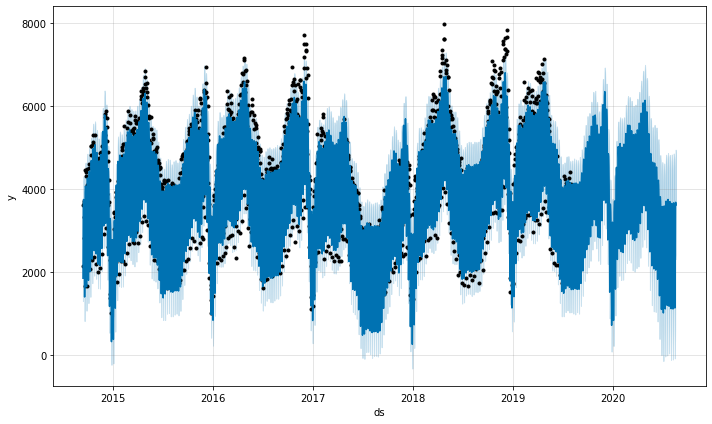

In [94]:
fig1 = Model.plot(forecast)

Вау!

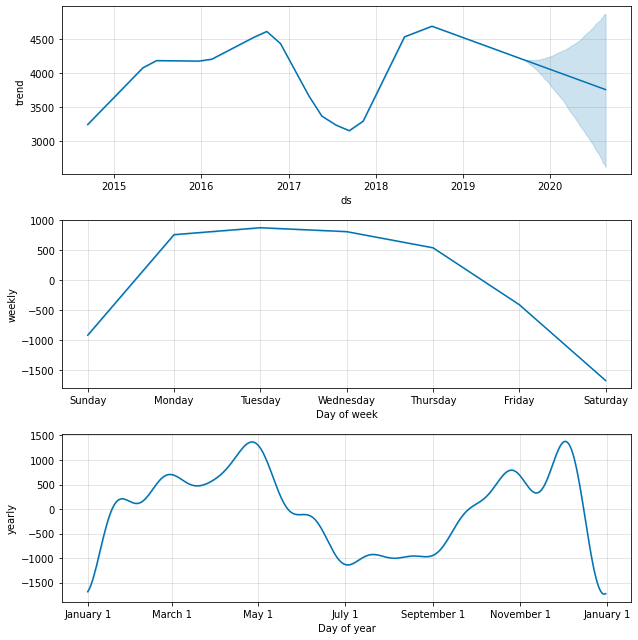

In [95]:
fig2 = Model.plot_components(forecast)

In [96]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(Model, forecast)

In [97]:
# посчитайте метрики на test


In [98]:
MAE(test_ts2['y'], forecast[-len(test_ts2['ds']):]['yhat'])

531.8357405027466

In [99]:
# нарисуйте пресказания

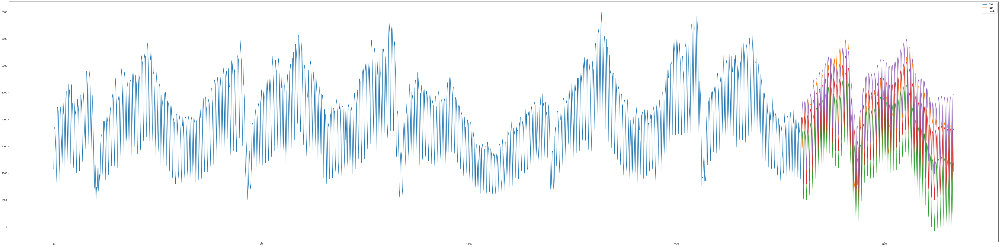

In [100]:
plt.plot(train_ts2['y'])
plt.plot(test_ts2['y'])
plt.plot(forecast[-len(test_ts2['ds']):]['yhat_lower'])
plt.plot(forecast[-len(test_ts2['ds']):]['yhat'])
plt.plot(forecast[-len(test_ts2['ds']):]['yhat_upper'])
plt.legend(['Train', 'Test', 'Predict']);

## Бонус. Напишите свою модель на STAN (3 балла).

Разработайте и испытай свою модель для месячного ряда в STAN.

Сравните качество прогнозов с наивной сезонной на тестовой выборке с помощью MAE. 



In [101]:
# ваш код модели на STAN и её обучения моделей здесь

In [102]:
# посчитайте метрики на test

In [103]:
# нарисуйте пресказания